In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("data/CC GENERAL.csv")
df.shape

(8950, 18)

#### Data Cleaning

Handling Missing Values
- Handling Missing Values
- Handling Duplicates
- Check data type
- Understand the dataset

In [3]:
features_with_na = [features for features in df.columns if df[features].isnull().sum()>=1]
for feature in features_with_na:
    print(feature, np.round(df[feature].isnull().mean()*100, 5), "% missing values")

CREDIT_LIMIT 0.01117 % missing values
MINIMUM_PAYMENTS 3.49721 % missing values


- Here it is MCAR type of missing values in dataset which are Missing completely at Random
- When we make this assumption, we are assuming the missing data is completely unrelated to the other information in the data

In [4]:
df[features_with_na].select_dtypes(exclude="object").describe()

,CREDIT_LIMIT,MINIMUM_PAYMENTS
count,8949.000000,8637.000000
mean,4494.449450,864.206542
std,3638.815725,2372.446607
min,50.000000,0.019163
25%,1600.000000,169.123707
50%,3000.000000,312.343947
75%,6500.000000,825.485459
max,30000.000000,76406.207520


#### Imputing Null Values
- Impute Median value for MINIMUM_PAYMENTS column
- Impute Median for CREDIT_LIMIT column

In [5]:

####### Deprecated #########
# df.MINIMUM_PAYMENTS.fillna(df.MINIMUM_PAYMENTS.median(), inplace=True)
# df.CREDIT_LIMIT.fillna(df.CREDIT_LIMIT.median(), inplace=True)

####### NEWER #######

df.fillna({"MINIMUM_PAYMENTS": df["MINIMUM_PAYMENTS"].median()}, inplace=True)
df.fillna({"CREDIT_LIMIT":df["CREDIT_LIMIT"].median()}, inplace=True)

In [6]:
# Other Data Cleaning Steps

# Handling Duplicates

df.duplicated().sum()

np.int64(0)

- There are no duplicates in the dataset

- Remove Customer ID from the dataset as it cannot be used in Model Training

In [7]:
df.drop("CUST_ID", inplace=True, axis=1)

#### Feature Engineering

In [8]:
numerical_features = [col for col in df.columns if df[col].dtypes != "O"]
categorical_features = [col for col in df.columns if df[col].dtypes == "O"]

print(f"Number of numerical features {len(numerical_features)}")
print(f"Number of categorical features {len(categorical_features)}")

Number of numerical features 17
Number of categorical features 0


In [9]:
# Discrete Features
discrete_features = [col for col in numerical_features if df[col].nunique() <=25 ]
print(f"Number of discrete_features {len(discrete_features)}")

Number of discrete_features 1


In [10]:
discrete_features

['TENURE']

In [11]:
continuous_features = [col for col in df.columns if col not in discrete_features]
print(f"Number of continuous features  {len(continuous_features)}")

Number of continuous features  16


#### Checking for Multicollinearity

In [12]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def compute_vif(considered_features, df):
    X = df[considered_features]

    X["intercept"] = 1

    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif["Variable"]!="intercept"]
    return vif
    

In [13]:
compute_vif(numerical_features, df)

,Variable,VIF
0,BALANCE,2.659548
1,BALANCE_FREQUENCY,1.309603
2,PURCHASES,48156.703161
3,ONEOFF_PURCHASES,29073.254792
4,INSTALLMENTS_PURCHASES,8618.756071
5,CASH_ADVANCE,2.870797
6,PURCHASES_FREQUENCY,10.797447
7,ONEOFF_PURCHASES_FREQUENCY,3.956943
8,PURCHASES_INSTALLMENTS_FREQUENCY,9.504382
9,CASH_ADVANCE_FREQUENCY,3.511863


- VIF determines the strength of the correlation between the idependent variables. It is predicted by taking a variable and regression it against the every other variable
- This Dataset columns has Multi collinearity we can reduce dimension using PCA

#### Checking outlier and Capping It

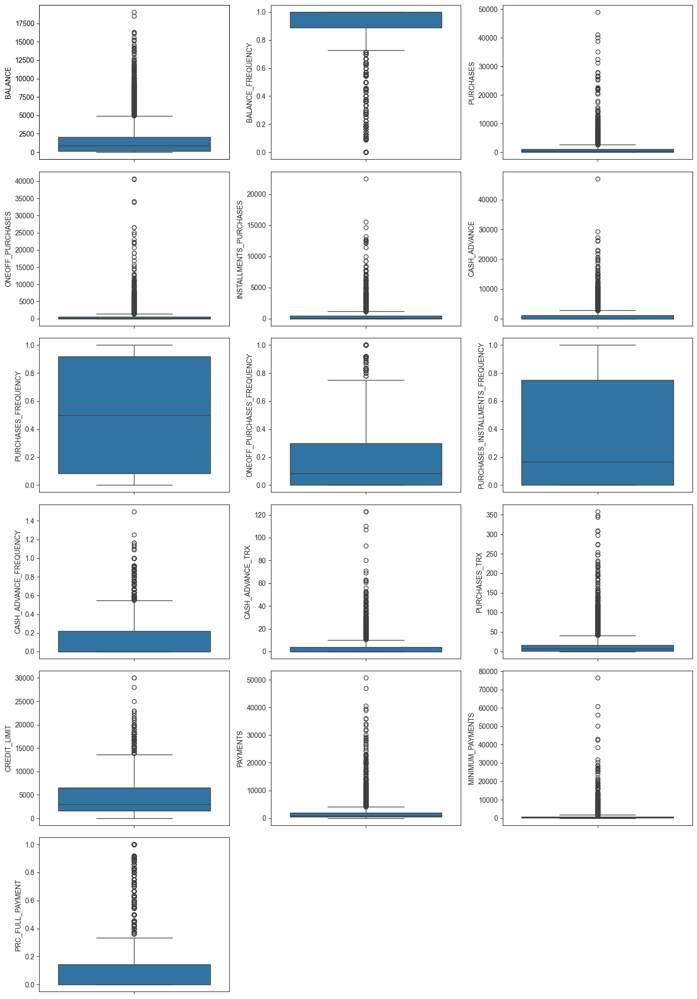

In [14]:
plt.figure(figsize=(14,20))

for i in range(len(continuous_features)):
    plt.subplot(6,3, i+1)
    sns.set_style("ticks")
    ax = sns.boxplot(df[continuous_features[i]])
    plt.tight_layout()

In [15]:
def detect_outliers(col):
    percentile25 = df[col].quantile(0.25)
    percentile75 = df[col].quantile(0.75)
    print("\n ####", col, "####")
    print("percentile25", percentile25)
    print("percentile75", percentile75)
    q3 = percentile75
    q1 = percentile25
    iqr = q3-q1 
    upper_limit = q3 + 1.5*iqr
    lower_limit = q1 - 1.5*iqr
    print("lower limit", lower_limit)
    print("upper limit", upper_limit)

    df.loc[df[col] > upper_limit, col] = upper_limit
    df.loc[df[col] < lower_limit, col] = lower_limit
    return df


In [16]:
for col in continuous_features:
    detect_outliers(col)


 #### BALANCE ####
percentile25 128.2819155
percentile75 2054.1400355
lower limit -2760.5052645
upper limit 4942.9272155

 #### BALANCE_FREQUENCY ####
percentile25 0.888889
percentile75 1.0
lower limit 0.7222225000000001
upper limit 1.1666664999999998

 #### PURCHASES ####
percentile25 39.635
percentile75 1110.13
lower limit -1566.1075000000003
upper limit 2715.8725000000004

 #### ONEOFF_PURCHASES ####
percentile25 0.0
percentile75 577.405
lower limit -866.1075
upper limit 1443.5124999999998

 #### INSTALLMENTS_PURCHASES ####
percentile25 0.0
percentile75 468.6375
lower limit -702.95625
upper limit 1171.59375

 #### CASH_ADVANCE ####
percentile25 0.0
percentile75 1113.8211392500002
lower limit -1670.7317088750003
upper limit 2784.5528481250003

 #### PURCHASES_FREQUENCY ####
percentile25 0.083333
percentile75 0.916667
lower limit -1.166668
upper limit 2.166668

 #### ONEOFF_PURCHASES_FREQUENCY ####
percentile25 0.0
percentile75 0.3
lower limit -0.44999999999999996
upper limit 0.75

 

#### After outlier treatment

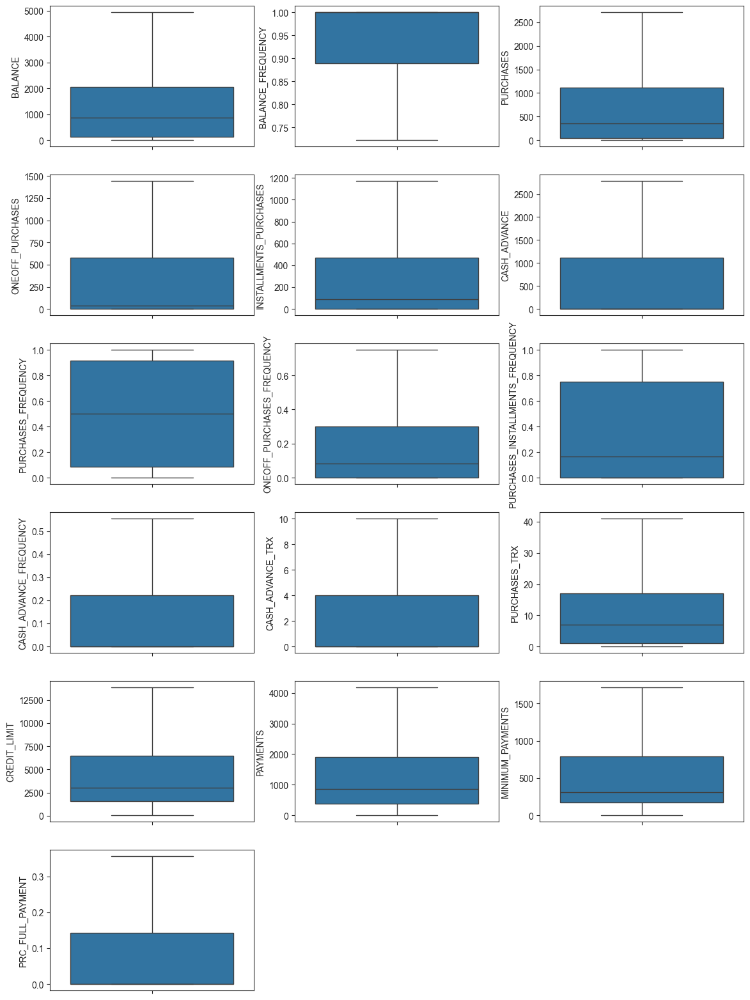

In [17]:

plt.figure(figsize=(14,20))

for i , feature in enumerate(continuous_features):
    plt.subplot(6,3, i+1)
    sns.set_style("ticks")
    sns.boxplot(data=df, y=feature) # use 'y' here to make orientation vertical
    plt.tight_layout

#### Feature Scaling

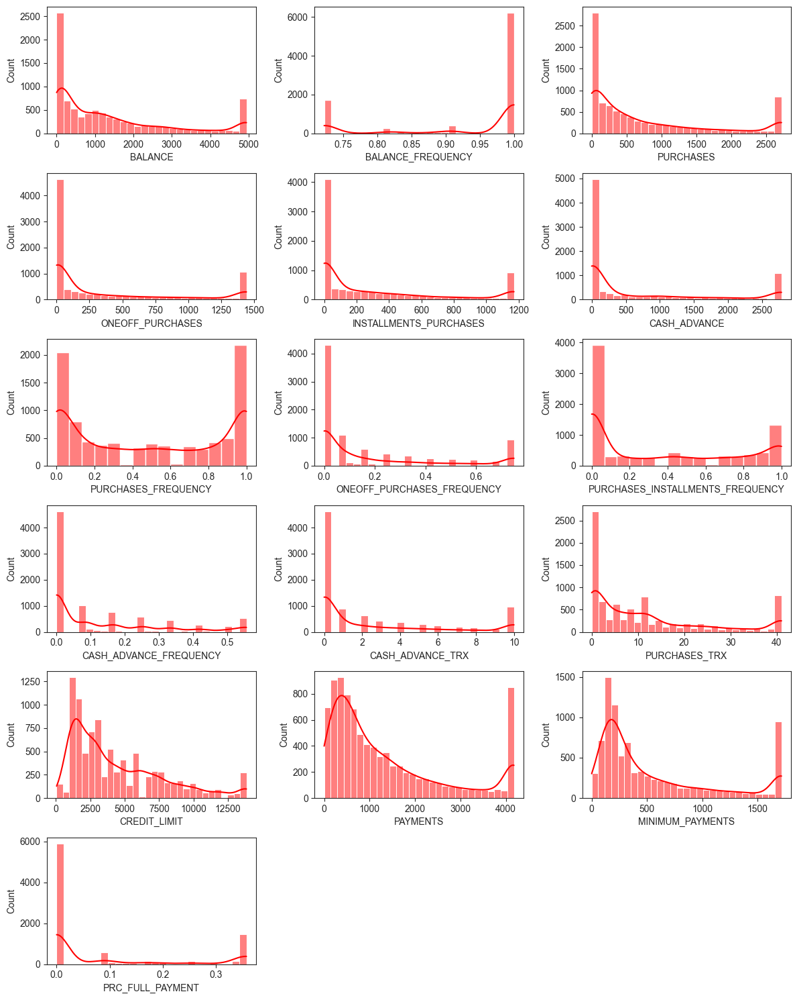

In [18]:
plt.figure(figsize=(12,15))

for i in range(len(continuous_features)):
    plt.subplot(6,3,i+1)
    sns.histplot(df[continuous_features[i]], color="r", kde=True)
    plt.xlabel(continuous_features[i])
    plt.tight_layout()

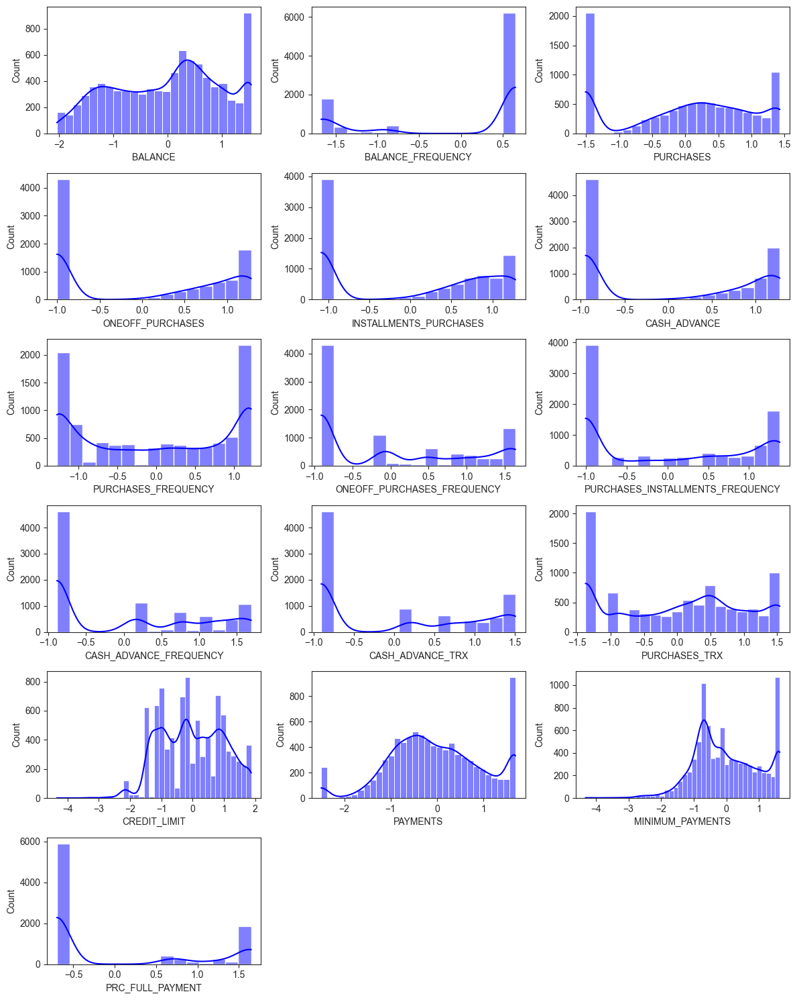

In [19]:
# Scaling the Data

from sklearn.preprocessing import PowerTransformer, MinMaxScaler
dfscaled = df.copy().astype("float64")
dfscaled[:] = PowerTransformer().fit_transform(dfscaled)
plt.figure(figsize=(12,15))
for i in range(len(continuous_features)):
    plt.subplot(6,3, i+1)
    sns.histplot(x=dfscaled[continuous_features[i]], color="b", kde=True)
    plt.xlabel(continuous_features[i])
    plt.tight_layout()

In [20]:
# Checking Skewness after Outlier Capping

dfscaled[continuous_features].skew(axis=0, skipna=True).to_frame()

,0
BALANCE,-0.177956
BALANCE_FREQUENCY,-0.916150
PURCHASES,-0.297026
ONEOFF_PURCHASES,0.083224
INSTALLMENTS_PURCHASES,-0.054007
CASH_ADVANCE,0.171678
PURCHASES_FREQUENCY,-0.044848
ONEOFF_PURCHASES_FREQUENCY,0.504738
PURCHASES_INSTALLMENTS_FREQUENCY,0.217056
CASH_ADVANCE_FREQUENCY,0.477566


In [21]:
import statsmodels.api as sm
skewness = np.apply_along_axis(sm.stats.stattools.stats.skew, axis=0, arr=df[continuous_features])
pd.DataFrame(skewness, index=continuous_features, columns=["skewness"])

,skewness
BALANCE,1.166508
BALANCE_FREQUENCY,-1.172782
PURCHASES,1.206178
ONEOFF_PURCHASES,1.237009
INSTALLMENTS_PURCHASES,1.217184
CASH_ADVANCE,1.241564
PURCHASES_FREQUENCY,0.060154
ONEOFF_PURCHASES_FREQUENCY,1.250754
PURCHASES_INSTALLMENTS_FREQUENCY,0.509116
CASH_ADVANCE_FREQUENCY,1.273668


In [38]:
# Model Building

# function for Silhouette score plot

from sklearn .metrics import silhouette_score, silhouette_samples
from matplotlib import cm

def silhouette_plot(model, range_n_clusters, X_clustering, pca, **kwargs):
    for n_clusters in range_n_clusters:
        fig, (ax1, ax2) = plt.subplots(1,2)
        fig.set_size_inches(18,7)

        # 1st subplot => silhouette plot
        ax1.set_xlim([-0.1, 1])
        # (n_clusters+1)*10 is for inserting blank space between silhouette
        ax1.set_ylim([0, len(X_clustering) + (n_clusters + 1) * 10])

        clusterer = model(n_clusters, **kwargs)
        cluster_labels = clusterer.fit_predict(X_clustering)

        silhoette_avg = silhouette_score(X_clustering, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhoette_score is", silhouette_avg)

        sample_silhouette_values = silhouette_samples(X_clustering, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels ==i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7
            )

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            # compute the new y_lower for next plot
            y_lower = y_upper +10

        ax1.set_title("The silhouette plot for the various clusters")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.set_yticks([])
        ax1.set_xticks([-0.2, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        sns.scatterplot(
            x = pca[:, 0],
            y = pca[:, 1],
            hue = cluster_labels,
            palette = sns.color_palette("colorblind", len(set(cluster_labels))),
            alpha=0.7,
            legend= "full",
            ax=ax2
        )

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            f"Silhouette analysis for {model.__name__} clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold"    
        )
    plt.show()        

            

In [23]:
# PCA
from sklearn.decomposition import PCA
var_ratio = {}
for n in range(2,18):
    pc = PCA(n_components=n)
    df_pca = pc.fit(dfscaled)
    var_ratio[n] = sum(df_pca.explained_variance_ratio_)

var_ratio

{2: np.float64(0.5821415419935072),
 3: np.float64(0.6829577877259292),
 4: np.float64(0.7619872795644954),
 5: np.float64(0.8304533335603674),
 6: np.float64(0.8783308048710112),
 7: np.float64(0.9164199129809512),
 8: np.float64(0.9467227686729802),
 9: np.float64(0.9656662755076569),
 10: np.float64(0.9754980124393232),
 11: np.float64(0.9826272649266885),
 12: np.float64(0.9884147368362947),
 13: np.float64(0.9923424779401956),
 14: np.float64(0.9958050477885206),
 15: np.float64(0.9979745783257076),
 16: np.float64(0.999126284967172),
 17: np.float64(1.0)}

<Axes: >

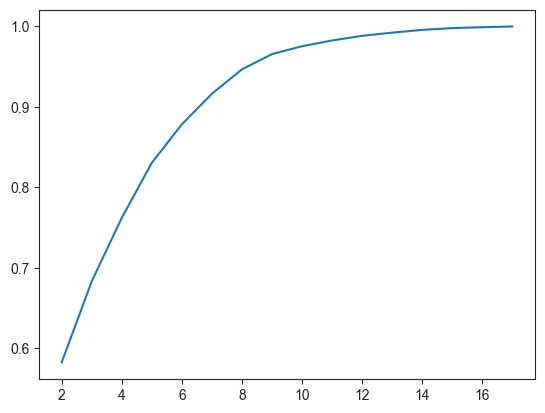

In [24]:
pd.Series(var_ratio).plot()

In [27]:
# Choosing PCA n_components and Kmeans n_clusters based on Clustering metrics
from sklearn.cluster import KMeans

import os
os.environ["LOKY_MAX_CPU_COUNT"] = str(os.cpu_count())  # Set to logical core count

for y in range(2,8):
    print("PCA with # of components:", y)
    pca = PCA(n_components=y)
    data_p = pca.fit_transform(dfscaled)
    for cluster in range(2,7):
        x = cluster
        kmeans = KMeans(n_clusters =x)
        label = kmeans.fit_predict(data_p)
        print("Silhouette-Score for", x, "Clusters:", silhouette_score(data_p, label) , "- Inertia: ", kmeans.inertia_)
    print()   

PCA with # of components: 2
Silhouette-Score for 2 Clusters: 0.44129036870183824 - Inertia:  46805.347204150145
Silhouette-Score for 3 Clusters: 0.4422369019735761 - Inertia:  28000.86129993528
Silhouette-Score for 4 Clusters: 0.4365740769931272 - Inertia:  20382.86777600675
Silhouette-Score for 5 Clusters: 0.3887540224236139 - Inertia:  17102.92712659071
Silhouette-Score for 6 Clusters: 0.36214787150969335 - Inertia:  14242.811897475238

PCA with # of components: 3
Silhouette-Score for 2 Clusters: 0.37836636309562677 - Inertia:  62141.16870835112
Silhouette-Score for 3 Clusters: 0.3720830277553336 - Inertia:  43313.89636305062
Silhouette-Score for 4 Clusters: 0.3921628374529444 - Inertia:  34510.68458365958
Silhouette-Score for 5 Clusters: 0.40372495804417946 - Inertia:  26786.96938700298
Silhouette-Score for 6 Clusters: 0.38352655275325354 - Inertia:  23897.331255271412

PCA with # of components: 4
Silhouette-Score for 2 Clusters: 0.34090579642796226 - Inertia:  74063.41592881053
Sil

- we can go with PCA with 2 components
- we can go with Kmeans Clusters in the range of 3-5 as it has Good score with lesser Inertia compared to others

In [26]:
import os
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Set LOKY_MAX_CPU_COUNT to avoid warnings about physical cores
os.environ["LOKY_MAX_CPU_COUNT"] = str(os.cpu_count())

# Assuming dfscaled is defined and contains your scaled data
for y in range(2, 8):
    print("PCA with # of components:", y)
    pca = PCA(n_components=y)
    data_p = pca.fit_transform(dfscaled)
    
    for cluster in range(2, 8):  # Adjusted to include 7 clusters
        kmeans = KMeans(n_clusters=cluster, n_init=10, max_iter=300)  # Added n_init for stability
        label = kmeans.fit_predict(data_p)
        
        silhouette_avg = silhouette_score(data_p, label)
        inertia = kmeans.inertia_
        
        print(f"Silhouette Score for {cluster} Clusters: {silhouette_avg:.4f} - Inertia: {inertia:.4f}")
    
    print()



PCA with # of components: 2
Silhouette Score for 2 Clusters: 0.4412 - Inertia: 46805.4000
Silhouette Score for 3 Clusters: 0.4422 - Inertia: 28000.7048
Silhouette Score for 4 Clusters: 0.4366 - Inertia: 20382.8678
Silhouette Score for 5 Clusters: 0.3889 - Inertia: 17103.2852
Silhouette Score for 6 Clusters: 0.3988 - Inertia: 13895.3336
Silhouette Score for 7 Clusters: 0.3874 - Inertia: 11488.0322

PCA with # of components: 3
Silhouette Score for 2 Clusters: 0.3783 - Inertia: 62141.1326
Silhouette Score for 3 Clusters: 0.3720 - Inertia: 43313.1340
Silhouette Score for 4 Clusters: 0.3919 - Inertia: 34510.1444
Silhouette Score for 5 Clusters: 0.4042 - Inertia: 26786.0681
Silhouette Score for 6 Clusters: 0.3627 - Inertia: 23400.4810
Silhouette Score for 7 Clusters: 0.3649 - Inertia: 20620.3402

PCA with # of components: 4
Silhouette Score for 2 Clusters: 0.3408 - Inertia: 74062.7052
Silhouette Score for 3 Clusters: 0.3264 - Inertia: 55235.8125
Silhouette Score for 4 Clusters: 0.3404 - Iner

In [45]:
pca_final = PCA(n_components=2, random_state=42).fit(dfscaled)

reduced = pca_final.fit_transform(dfscaled)

In [46]:
pcadf = pd.DataFrame(reduced)
pcadf.columns = ["PC1", "PC2"]

pcadf.head(10)

,PC1,PC2
0,-0.228171,-3.320507
1,-3.475161,0.879714
2,1.301709,1.286632
3,-1.332546,-0.392723
4,-1.013260,-1.462602
5,1.269259,0.430818
6,4.248961,1.664251
7,1.583661,-0.159666
8,1.224464,0.207567
9,0.636276,-1.069199


In [47]:
pca_final.explained_variance_ratio_

array([0.35805564, 0.2240859 ])

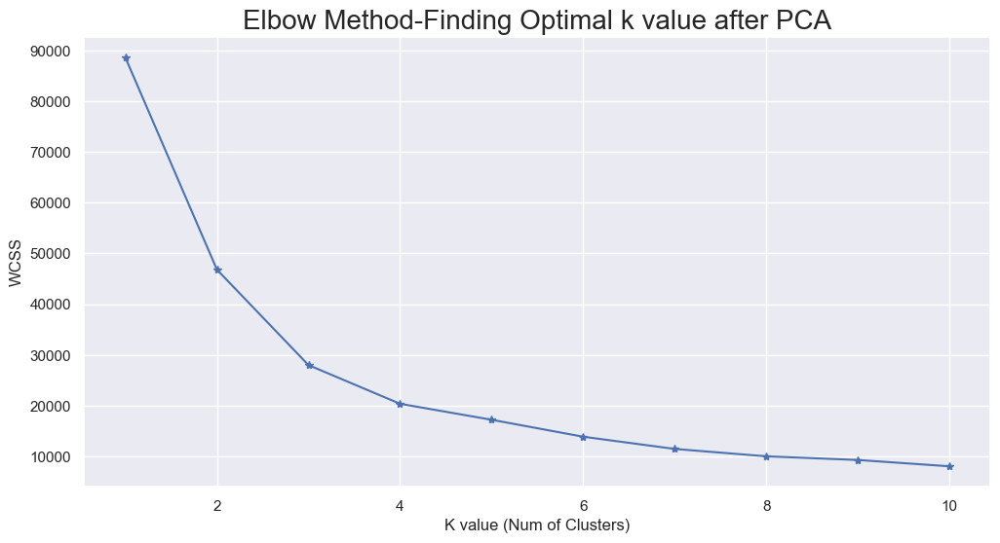

In [48]:
# Elbow Method to find best clusters for K-Means
wcss = {}
sns.set()
plt.figure(figsize=(12,6))
for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit(pcadf)
    wcss[i] = km.inertia_

plt.plot(range(1,11), wcss.values(), marker="*")
plt.title("Elbow Method-Finding Optimal k value after PCA", fontsize=20)
plt.xlabel("K value (Num of Clusters)")
plt.ylabel("WCSS")
plt.show()

- Here the optimum number of cluster is 3 or 4 cluster since it is the place where the graph start to flattenout meaing that having higher number of cluster will not yield a much more fitting machine

For n_clusters = 3 The average silhoette_score is 0.24598286947842699
For n_clusters = 4 The average silhoette_score is 0.24598286947842699
For n_clusters = 5 The average silhoette_score is 0.24598286947842699
For n_clusters = 6 The average silhoette_score is 0.24598286947842699


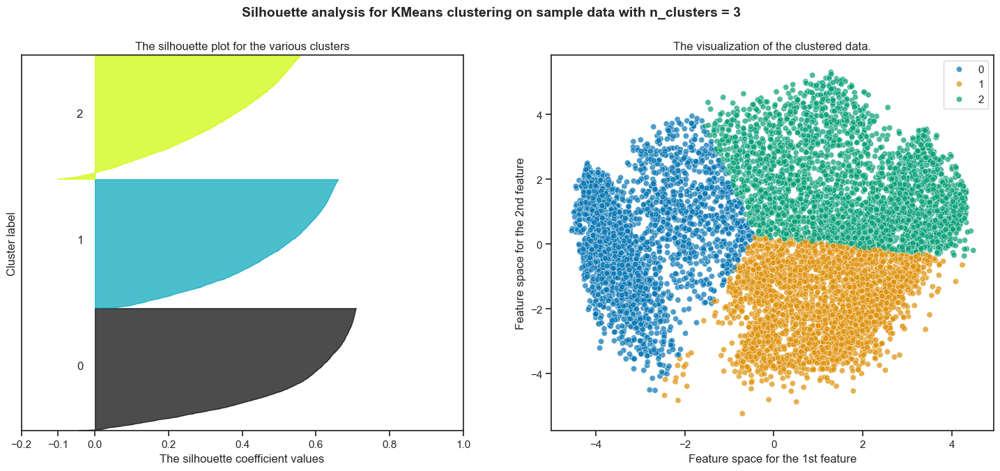

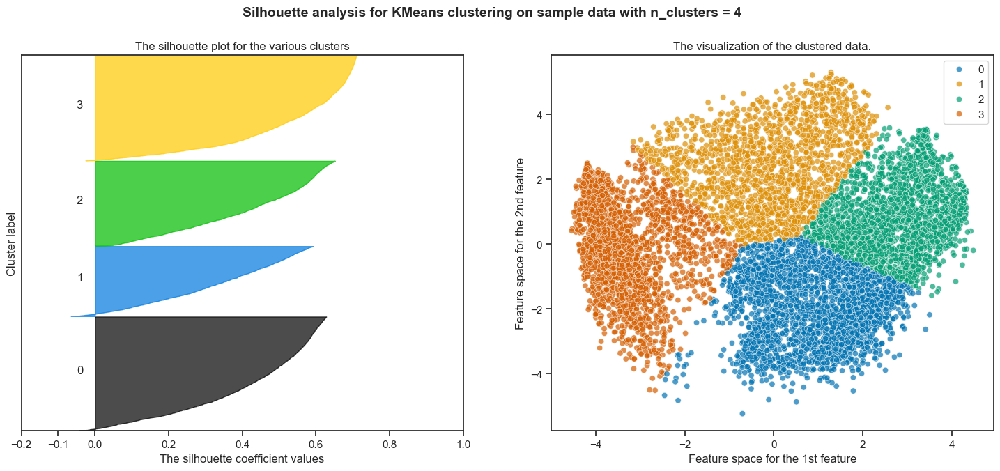

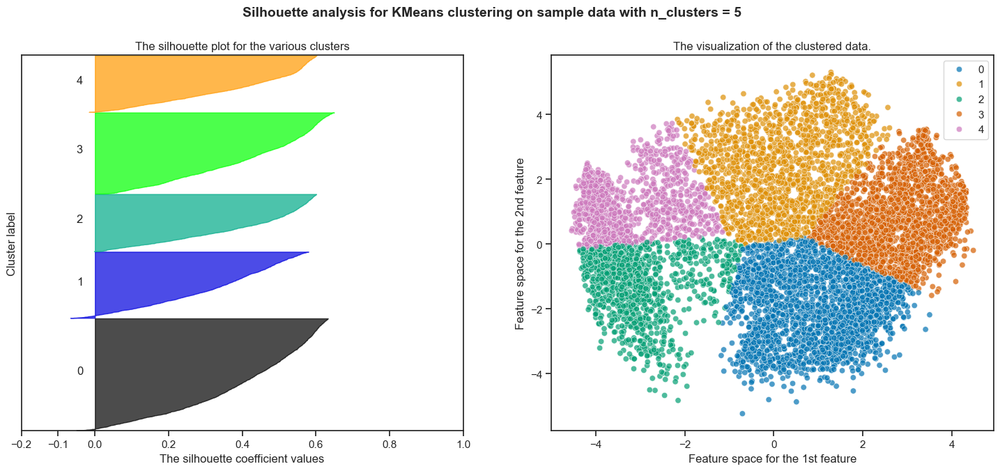

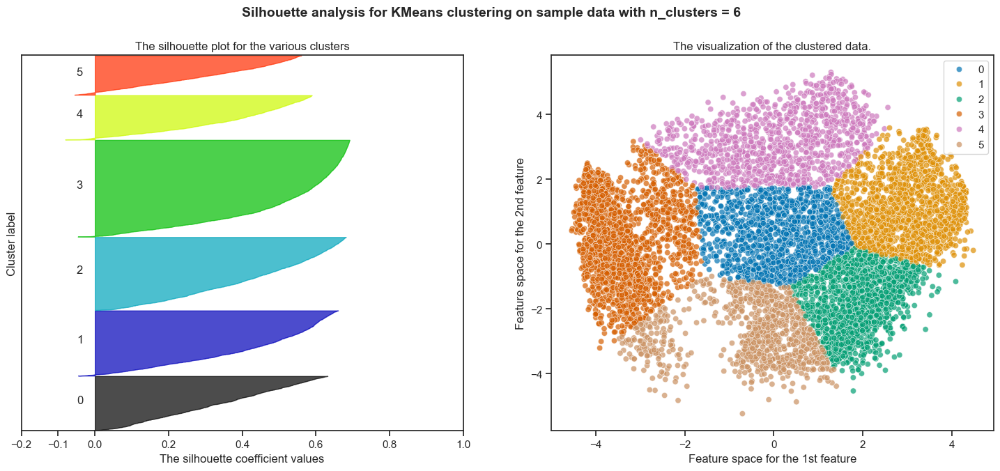

In [49]:
# Silhouette Score Plot for K-Means to choose best number of clusters
sns.set_style("ticks")
silhouette_plot(KMeans, range(3,7), pcadf, reduced)

In [41]:
# Avg Silhouette-Score for 3 Clusters: 0.4422 - Inertia: 28000.62
# Avg Silhouette-Score for 4 Clusters: 0.4366 - Inertia: 20382.85
# Clusters of 4 has good balance of inertia and Silhouette score, we can go with 4 clusters

In [50]:
# Apply Kmeans Clustering with 4 clusters
model = KMeans(n_clusters=4).fit(pcadf)
model_label = model.labels_
model_centers = model.cluster_centers_

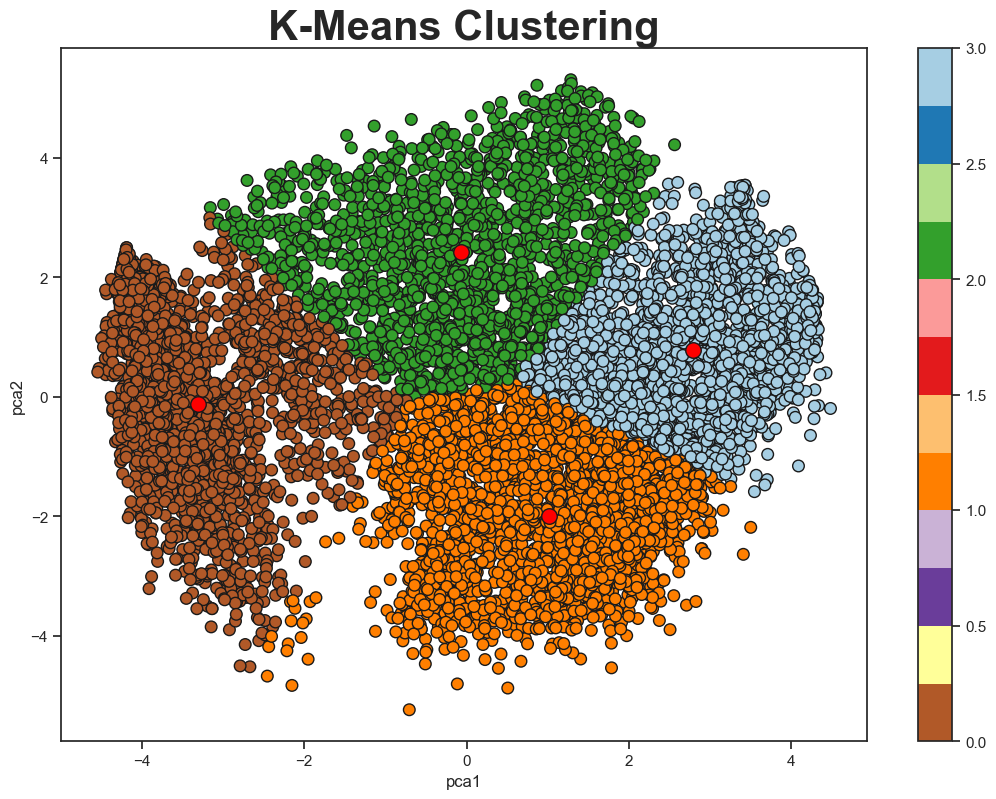

In [55]:
# Plotting the clustters
plt.figure(figsize=(13,9))
plt.title("K-Means Clustering", weight="bold", size=30)
plt.xlabel("pca1")
plt.ylabel("pca2")
scatter = plt.scatter(pcadf["PC1"], pcadf["PC2"], c=model_label, s=70, cmap="Paired_r", ec="k")
plt.colorbar(scatter)
plt.scatter(model_centers[:,0], model_centers[:, 1], c="red", marker=".", s=500, ec="k")

For n_clusters = 3 The average silhoette_score is 0.24598286947842699
For n_clusters = 4 The average silhoette_score is 0.24598286947842699
For n_clusters = 5 The average silhoette_score is 0.24598286947842699
For n_clusters = 6 The average silhoette_score is 0.24598286947842699
For n_clusters = 7 The average silhoette_score is 0.24598286947842699


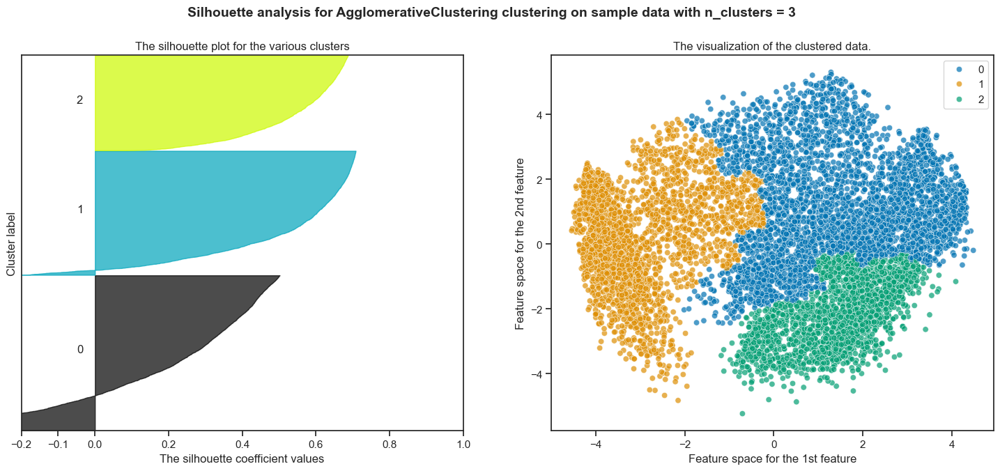

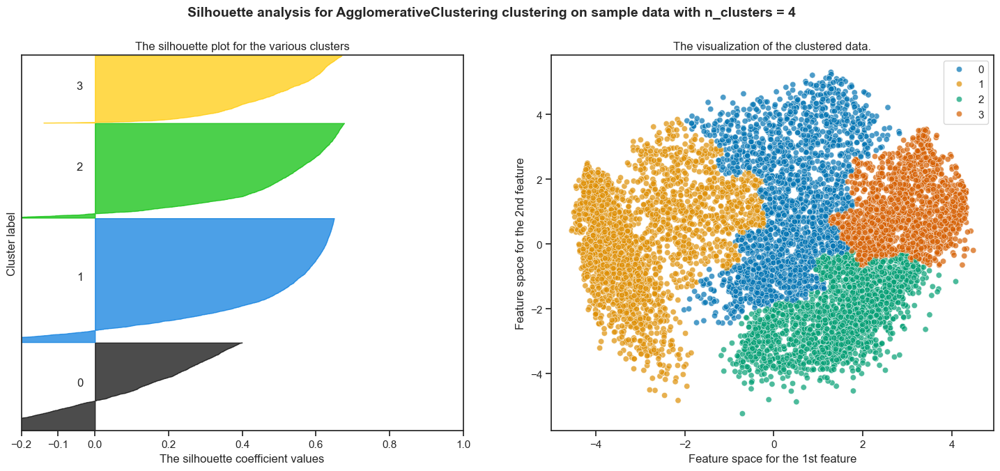

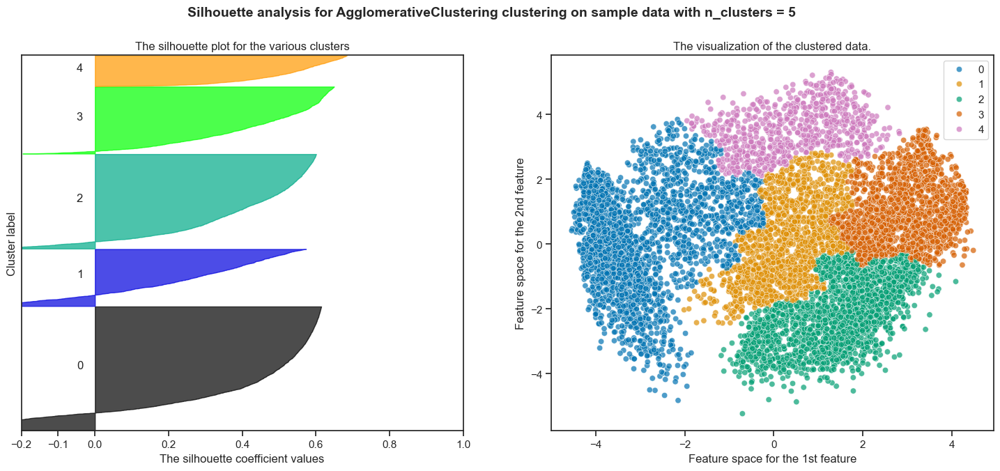

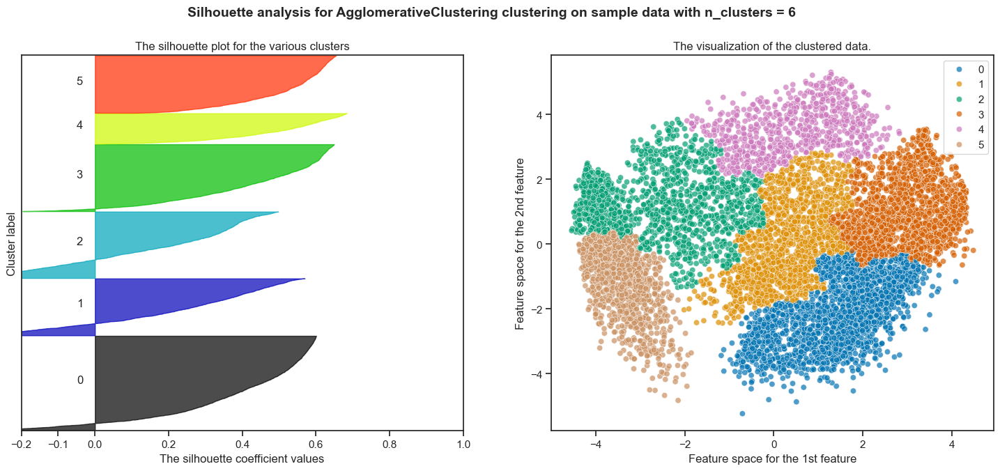

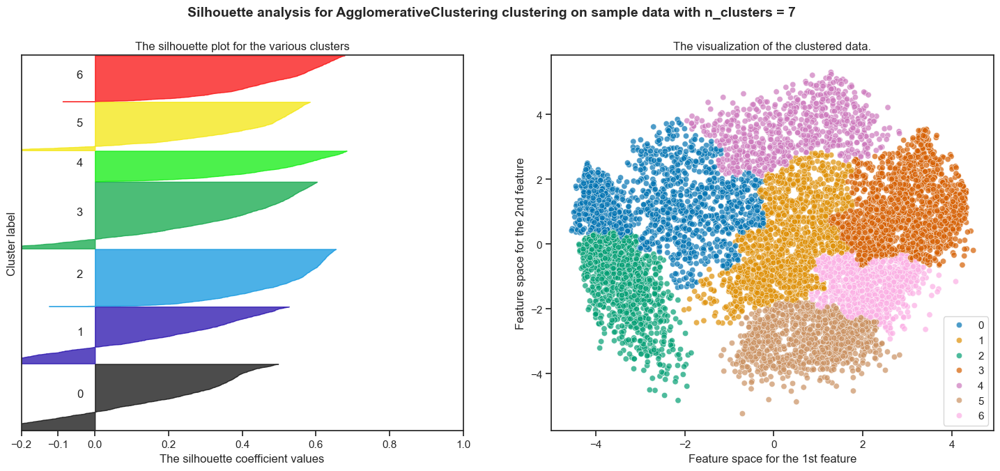

In [56]:
# Heirarchial(Agglomerative) Clustering

from sklearn.cluster import AgglomerativeClustering
silhouette_plot(AgglomerativeClustering, range(3,8), pcadf, reduced)

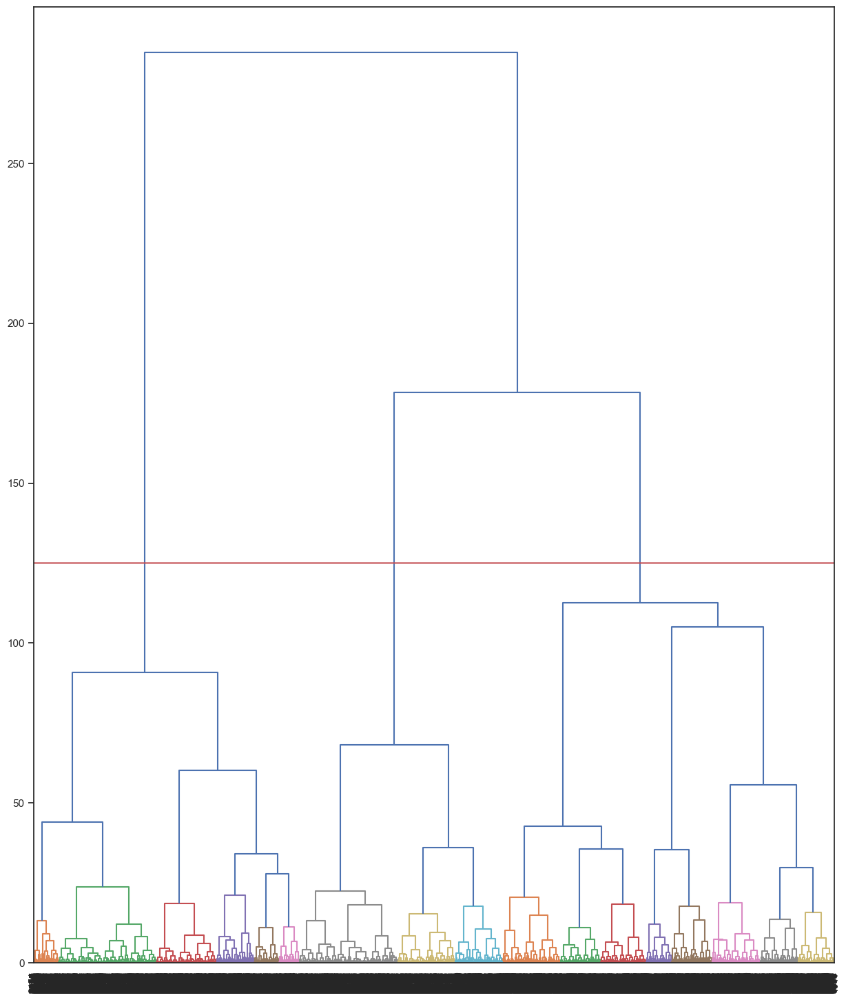

In [61]:
# Dendrogram to choose best number of CLusters
from scipy.cluster.hierarchy import dendrogram, linkage
plt.figure(figsize=(15,18))
merg=linkage(pcadf, method="ward")
dendrogram(merg, p=30, leaf_rotation=90, color_threshold=25, leaf_font_size=10, truncate_mode="level")
plt.plot([125]*2000000, color="r")
plt.show()

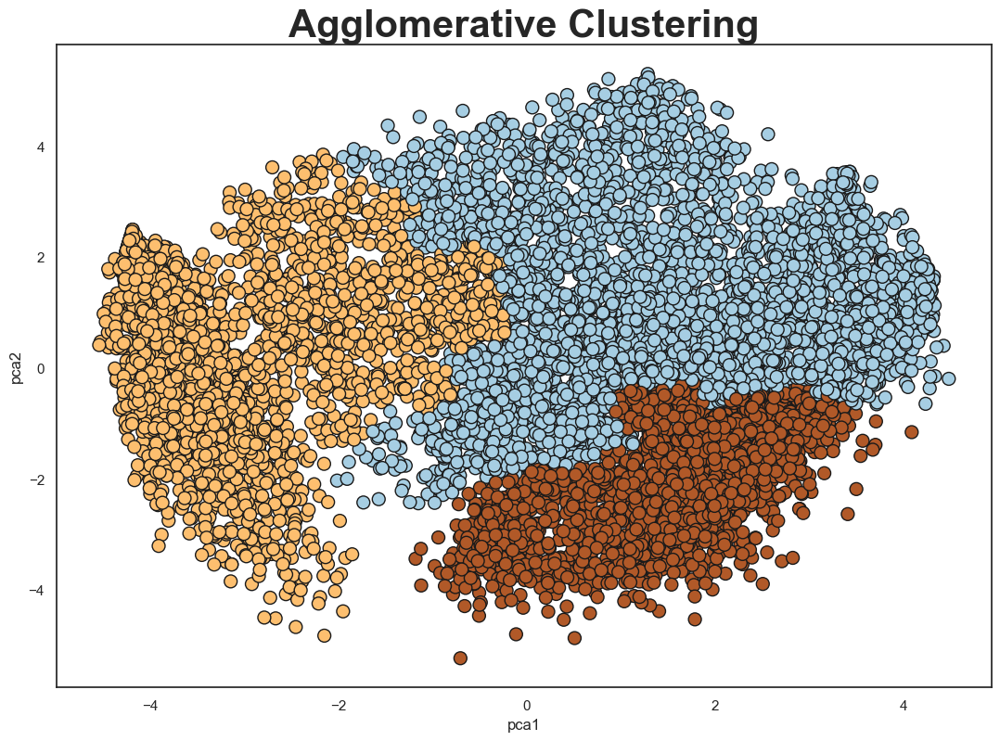

In [65]:
# visualization of agglromerative clustering

model = AgglomerativeClustering(n_clusters=3, metric="euclidean", linkage="ward").fit(reduced)
model_label = model.labels_
plt.figure(figsize=(13,9))

sns.set_style("white")
plt.title("Agglomerative Clustering", weight="bold", size=30)
plt.xlabel("pca1")
plt.ylabel("pca2")
scatter = plt.scatter(pcadf["PC1"], pcadf["PC2"], c=model_label, s=100, cmap="Paired", ec="k")


In [66]:
# Agglomerative clustering didn't perform well like K means clustering.
# The best Silhouette score was 0.38, were as K means had 0.43 Silhouette score.

For n_clusters = 3 The average silhoette_score is 0.24598286947842699
For n_clusters = 4 The average silhoette_score is 0.24598286947842699
For n_clusters = 5 The average silhoette_score is 0.24598286947842699
For n_clusters = 6 The average silhoette_score is 0.24598286947842699
For n_clusters = 7 The average silhoette_score is 0.24598286947842699


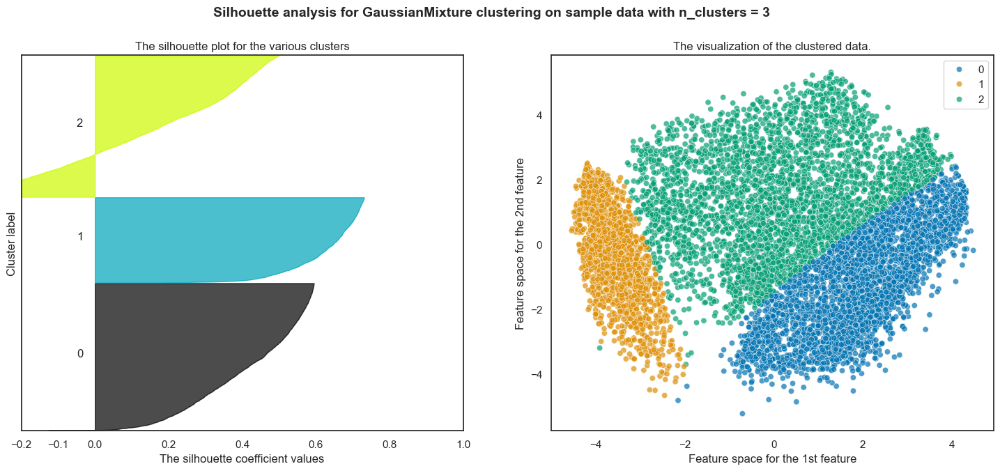

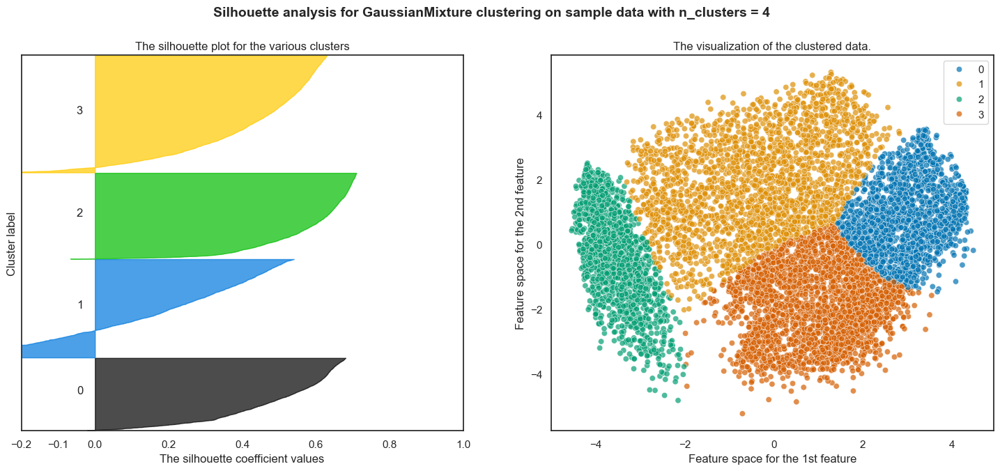

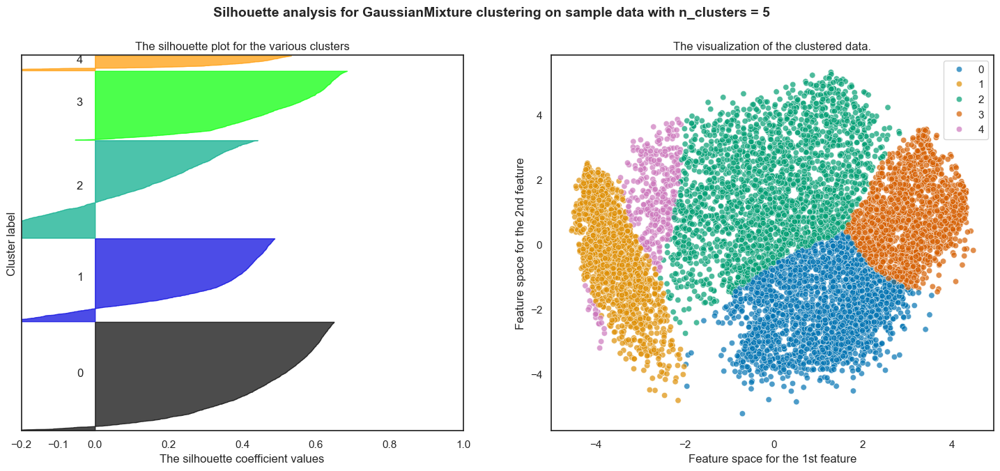

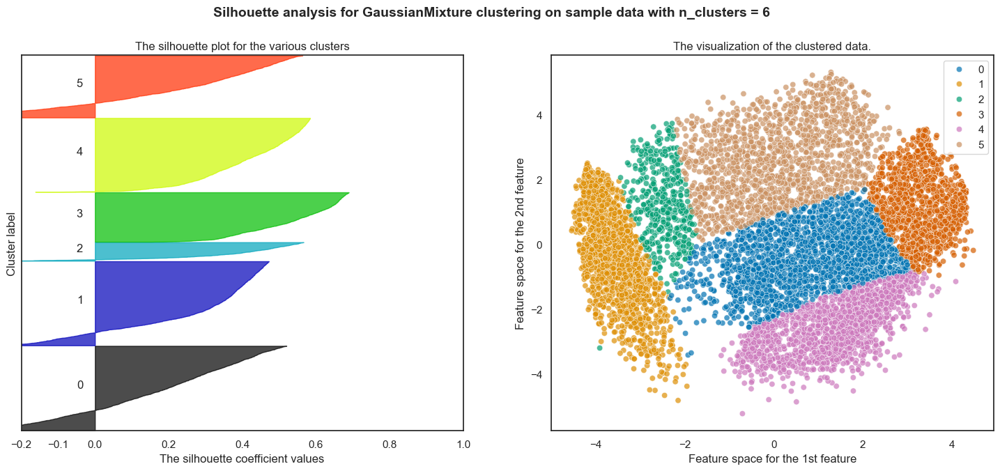

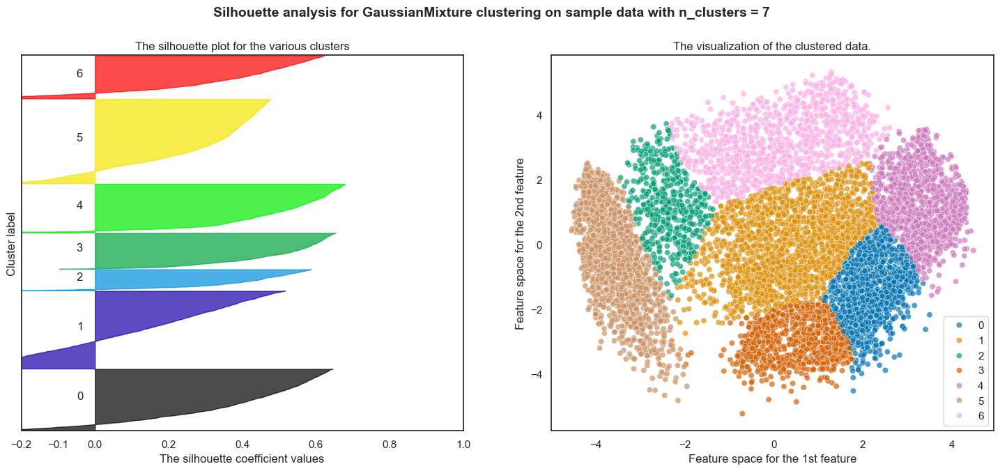

In [69]:
# Guassian Mixture
from sklearn.mixture import GaussianMixture
silhouette_plot(GaussianMixture, range(3,8), pcadf, reduced)

In [70]:
# for n_clusters = 4 The average silhouette_score is:0.4003
# which is highest score among the others. So we can go with Guassian Mixture clustering with 4 Clusters

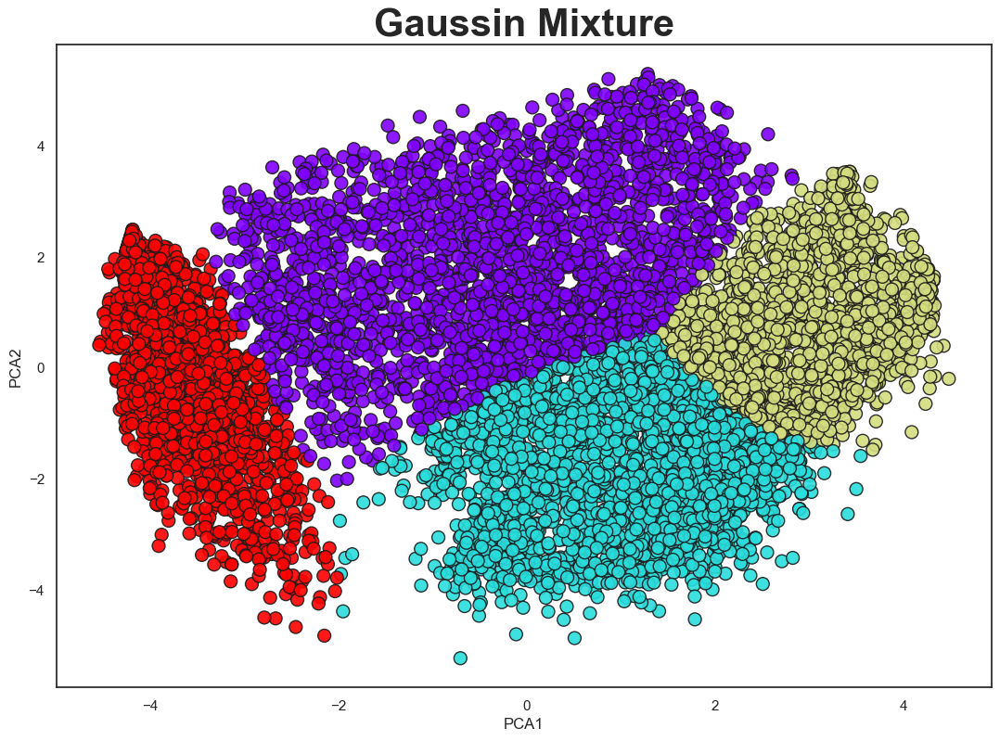

In [71]:
# Visualization for Gaussian Mixture
model = GaussianMixture(n_components=4, random_state=42).fit(reduced)
model_label = model.predict(reduced)
plt.figure(figsize=(13,9))

sns.set_style("white")
plt.title("Gaussin Mixture", weight="bold", size=30)
plt.xlabel("PCA1")
plt.ylabel("PCA2")
scatter = plt.scatter(pcadf["PC1"], pcadf["PC2"], c=model_label, s=100, cmap="rainbow", ec="k", alpha=0.9)

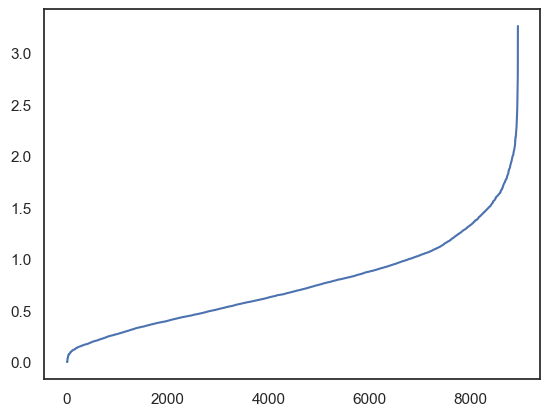

In [73]:
# Using DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

neighbors = NearestNeighbors(n_neighbors=17)
neighbors_fit = neighbors.fit(dfscaled)
distances, indices = neighbors_fit.kneighbors(dfscaled)

distances = np.sort(distances, axis=0)

distances = distances[:,1]
plt.plot(distances)
plt.show()

In [75]:
! pip install kneed

<Figure size 500x500 with 0 Axes>

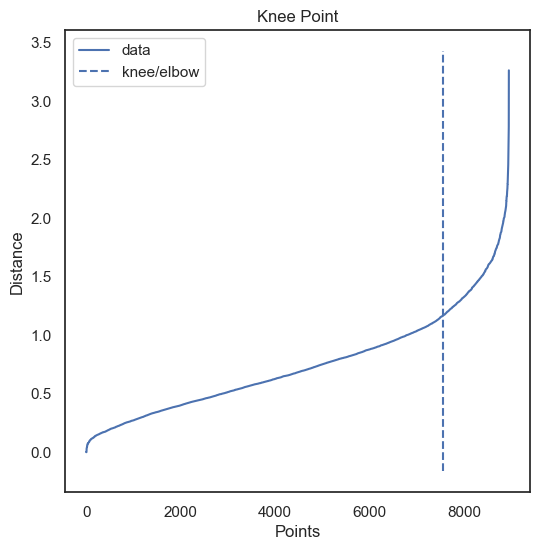

Knee Locator k= 1.171526324970122


In [76]:
from kneed import KneeLocator

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve="convex", direction="increasing", interp_method="polynomial")

fig = plt.figure(figsize=(5,5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")
plt.show()

k= distances[knee.knee]
print("Knee Locator k=", k)

In [ ]:
# For 2-dimensional data, use DBSCAN's default value of MinPts =4 

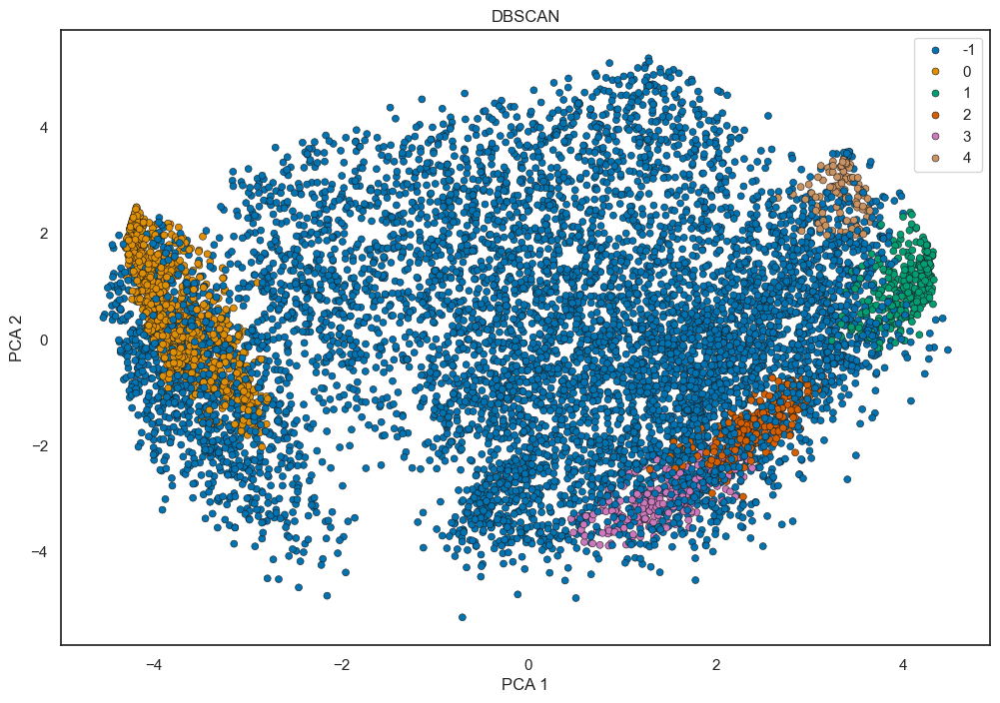

In [79]:
# Plot using PCA
model = DBSCAN(eps=k, min_samples=100).fit(dfscaled)
model_label = model.labels_
plt.figure(figsize=(12,8))

plt.title("DBSCAN")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
scatter = sns.scatterplot(x=reduced[:,0], y=reduced[:,1], hue=model_label, palette = sns.color_palette("colorblind", len(set(model_label))), s=25, ec="k")


- DBSCAN didn't perform well in clustering
- its clear that DBSCAN does not work to well when we are dealing with clusters of varying densities or with high dimensional data
- clusters with -1 values are outliers of each clusters

- from the above Models K means clustering has performed well with 3 and 4 clusters. if we take K-means Inertia into consideration we have choosen n_clusters=4

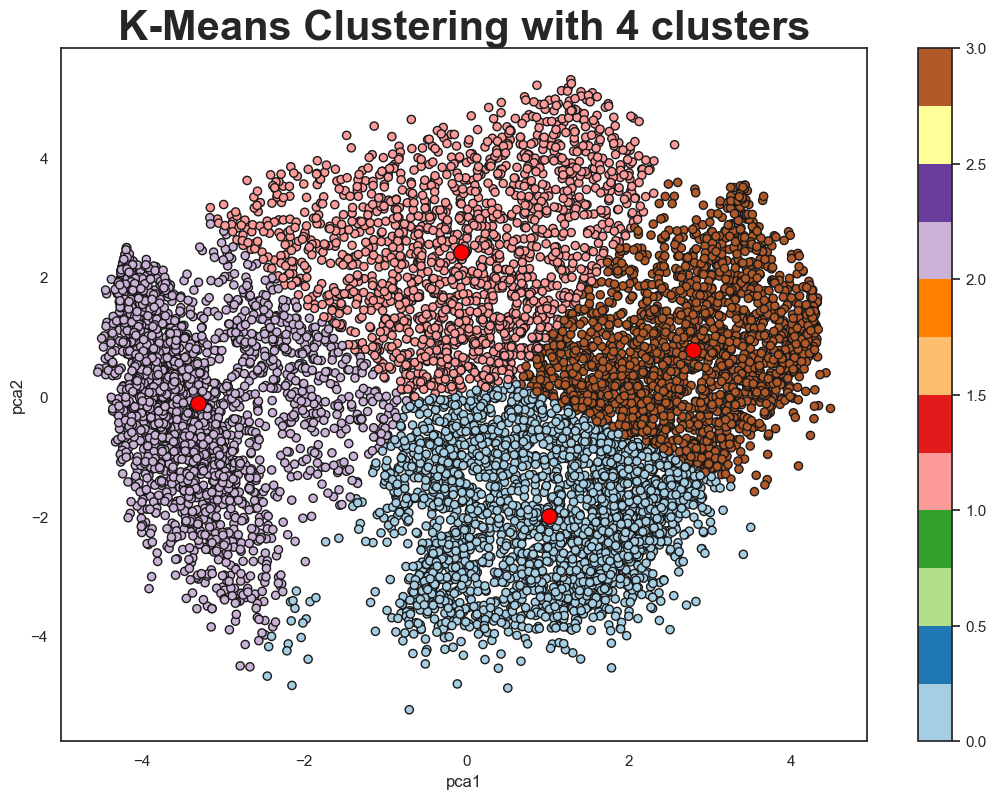

In [81]:
# Final Model

model = KMeans(n_clusters=4, init="k-means++").fit(pcadf)
model_label = model.labels_
model_centers = model.cluster_centers_
plt.figure(figsize=(13,9))
plt.title("K-Means Clustering with 4 clusters", weight="bold", size=30)
plt.xlabel("pca1")
plt.ylabel("pca2")
scatter = plt.scatter(pcadf["PC1"], pcadf["PC2"], c=model_label, s=35, cmap="Paired", ec="k")
plt.colorbar(scatter)
plt.scatter(model_centers[:,0], model_centers[:,1], c="red", marker=".", s=500, ec="k")

In [82]:
# Visualizing Decision Tree for Better Business Understanding

df["cluster"] = model.labels_.astype(int)
df.to_csv("./data/clustered_data.csv", index=False)

In [83]:
# Split X(train) and y(Test)
df1 = df.copy()
X = df1.drop("cluster", axis=1)
cols = X.columns
y = df["cluster"]
X = PowerTransformer().fit_transform(X)
X = pd.DataFrame(X, columns=cols)

In [84]:
# Decision Tree Classification for Visualization
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
tree_builder = DecisionTreeClassifier(max_depth = 3)
treeviz = tree_builder.fit(X[[ "BALANCE",
                              "ONEOFF_PURCHASES_FREQUENCY",
                              "PURCHASES_INSTALLMENTS_FREQUENCY",
                              "PURCHASES_FREQUENCY",
                              "MINIMUM_PAYMENTS",
                              "CREDIT_LIMIT"]],y)


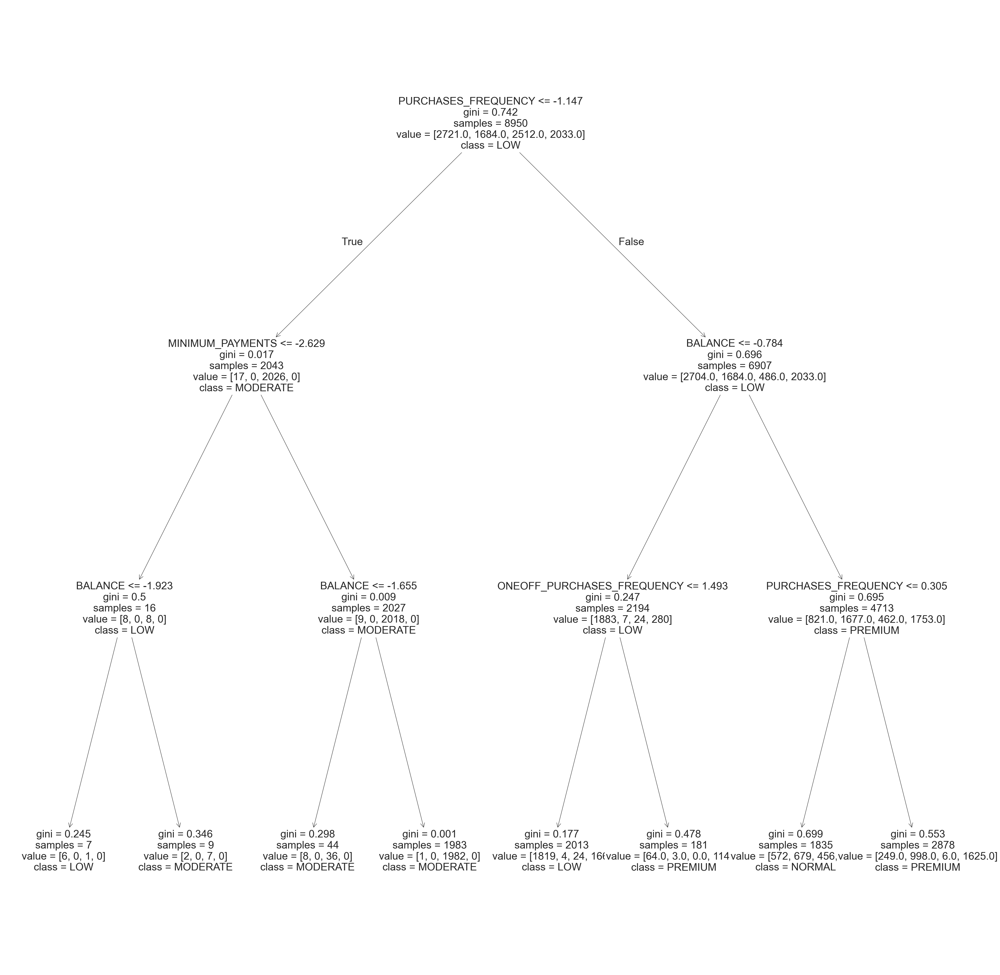

In [85]:
# plot decision tree with max depth 3 for better visualization
fig = plt.figure(figsize=(50,50))
tree.plot_tree(treeviz, feature_names=["BALANCE", 
                              "ONEOFF_PURCHASES_FREQUENCY",
                              "PURCHASES_INSTALLMENTS_FREQUENCY",
                              "PURCHASES_FREQUENCY",
                              "MINIMUM_PAYMENTS",
                              "CREDIT_LIMIT"],
                        class_names = ["LOW", "NORMAL", "MODERATE", "PREMIUM"], fontsize=30)
plt.show()

# Decision Tree Report
- Purchase Frequency is taken as Root node
- Minimum Payments and Balance is taken as second Decision node
- Leaf nodes has 4 Distinct features Low, Normal, Moderate, Premium(just for visualization)